In [1]:
# 2dbinned stats
import os
import numpy as np
import h5py
from scipy.stats import binned_statistic_2d
import pyproj
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfea
from pyproj import Proj, transform, Transformer, CRS
# import MisrToolkit as Mtk
from datetime import datetime
import gc
import pandas as pd
from netCDF4 import Dataset
import glob
from scipy.interpolate import griddata
from numpy import s_
import xarray as xr
from joblib import dump, load




In [36]:
Globe = ccrs.Globe(ellipse='WGS84', towgs84=[0,0,0,0,0,0,0])
Projection = ccrs.LambertAzimuthalEqualArea(central_longitude=0.0, central_latitude=-90.0, false_easting=0.0, false_northing=0.0, globe=Globe)



In [1]:
! pwd

/Users/micheltsamados/My Drive/ADMINISTRATION/ESA_ITT_ALBATROS_Tides/PM2_20211201/ALBRATROSS-main


In [4]:
! pip install xarray

     |████████████████████████████████| 870 kB 3.2 MB/s eta 0:00:01


In [31]:
# Globe = ccrs.Globe(ellipse='WGS84', towgs84=[0,0,0,0,0,0,0])
# Projection = ccrs.LambertAzimuthalEqualArea(central_longitude=0.0, central_latitude=-90.0, false_easting=0.0, false_northing=0.0, globe=Globe)



# import cartopy.feature as cfeature
# land_10m = cfeature.NaturalEarthFeature('physical', 'land', '10m',
# edgecolor='face',
# facecolor=cfeature.COLORS['land'])



# land = cfeature.COASTLINE

In [2]:
#from doc in /g/data/v45/pas561/bedmachineant/
#The projection is Polar Stereographic South (71ºS, 0ºE), which corresponds to
#ESPG 3031
inProj=CRS(init="epsg:3031")

#https://spatialreference.org/ref/epsg/wgs-84/
outProj=CRS(init="epsg:4326")

transformer = Transformer.from_crs(inProj, outProj)

/Users/micheltsamados/miniconda3/envs/icesat2020/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/Users/micheltsamados/miniconda3/envs/icesat2020/lib/python3.7/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))


# 1) Bathymetry 

In [3]:
#/Users/micheltsamados/Documents/Data/Bathymetry/BedmachineAntarctica/189467428/BedMachineAntarctica_2020-07-15_v02.nc

In [41]:
! ls /Users/micheltsamados/Documents/Data/Bathymetry/BedmachineAntarctica/189467428

BedMachineAntarctica_2020-07-15_v02.nc
BedMachineAntarctica_2020-07-15_v02.nc.xml


In [3]:
# path='/Users/micheltsamados/Documents/Data/Bathymetry/'
path='/Users/micheltsamados/Documents/Data/Bathymetry/BedmachineAntarctica/189467428/'
file='BedMachineAntarctica_2020-07-15_v02.nc'


df = xr.open_dataset(path+file)

In [4]:
df

<xarray.Dataset>
Dimensions:    (x: 13333, y: 13333)
Coordinates:
  * x          (x) int32 -3333000 -3332500 -3332000 ... 3332000 3332500 3333000
  * y          (y) int32 3333000 3332500 3332000 ... -3332000 -3332500 -3333000
Data variables:
    mapping    |S1 ...
    mask       (y, x) int8 ...
    firn       (y, x) float32 ...
    surface    (y, x) float32 ...
    thickness  (y, x) float32 ...
    bed        (y, x) float32 ...
    errbed     (y, x) float32 ...
    source     (y, x) int8 ...
    geoid      (y, x) int16 ...
Attributes:
    Conventions:                 CF-1.7
    Title:                       BedMachine Antarctica
    Author:                      Mathieu Morlighem
    version:                     15-Jul-2020 (v2.0)
    nx:                          13333.0
    ny:                          13333.0
    Projection:                  Polar Stereographic South (71S,0E)
    proj4:                       +init=epsg:3031
    sea_water_density (kg m-3):  1027.0
    ice_density (kg m-3):        917.0
    xmin:                        -3333000
    ymax:                        3333000
    spacing:                     500
    no_data:                     -9999.0
    license:                     No restrictions on access or use
    Data_citation:               Morlighem M. et al., (2019), Deep glacial tr...
    Notes:                       Data processed at the Department of Earth Sy...

In [5]:
xx, yy = np.meshgrid(df.x, df.y)
lon_bed, lat_bed = transformer.transform(xx, yy)

In [6]:
lon_bed.shape

(13333, 13333)

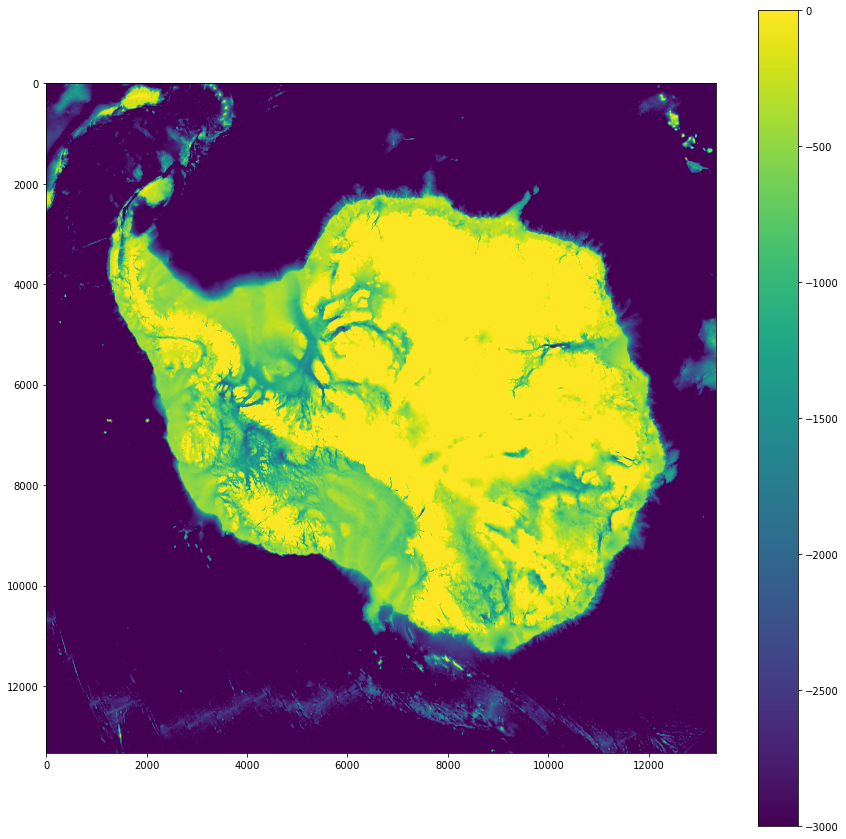

In [39]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
plt.imshow(df.bed,vmin=-3000,vmax=0)
plt.colorbar()

In [11]:
# plt.clf()
# plt.close()
# plt.figure(figsize=(15,15))
# plt.imshow(bathy_mask,vmin=-3000,vmax=0)
# # plt.pcolor(bathy_mask)
# plt.colorbar()
# # plt.savefig('BathyBedmachine.png', dpi = 1200)

In [40]:
bathy_grad = np.gradient(df.bed)
b_grad=bathy_grad[0]**2.+bathy_grad[1]**2.


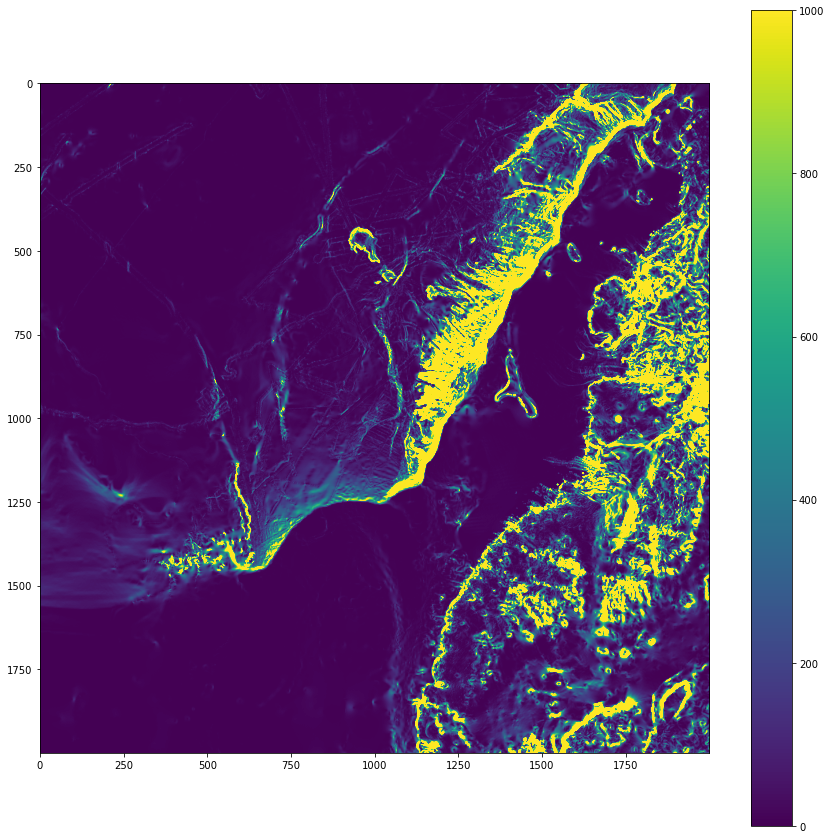

In [122]:

plt.clf()
plt.close()
plt.figure(figsize=(15,15))
ix1=2500 #0
ix2=4500 #7000
iy1=4000 #1000
iy2=6000 #8000
plt.imshow(b_grad[ix1:ix2,iy1:iy2],vmin=0,vmax=1000)
# plt.pcolor(bathy_mask)
plt.colorbar()
plt.savefig('BathyBedmachineGrad_zoom_tiny.png', dpi = 400)

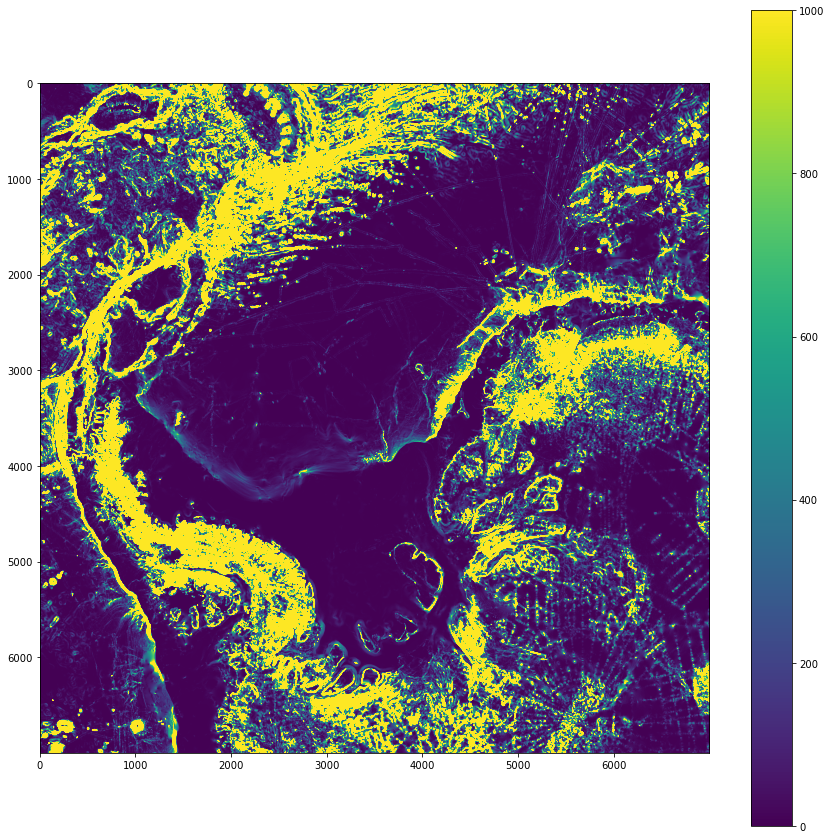

In [42]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
ix1=0
ix2=7000
iy1=1000
iy2=8000
plt.imshow(b_grad[ix1:ix2,iy1:iy2],vmin=0,vmax=1000)
# plt.pcolor(bathy_mask)
plt.colorbar()
# plt.savefig('BathyBedmachineGrad_zoom_small.png', dpi = 400)

In [ ]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
plt.imshow(b_grad,vmin=0,vmax=1000)
# plt.pcolor(bathy_mask)
plt.colorbar()
# plt.savefig('BathyBedmachineGrad_small.png', dpi = 400)

In [ ]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
ix1=0
ix2=7000
iy1=1000
iy2=8000
plt.imshow(b_grad[ix1:ix2,iy1:iy2],vmin=0,vmax=1000)
# plt.pcolor(bathy_mask)
plt.colorbar()
plt.savefig('BathyBedmachineGrad_tiny_small.png', dpi = 400)

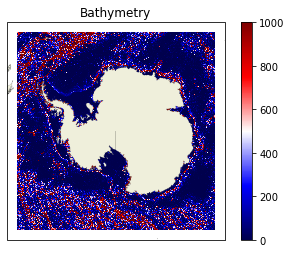

In [21]:
ax = plt.axes(projection = Projection)
plt.title('Bathymetry')
s=5
plt.pcolormesh(xx_BA[::s,::s], yy_BA[::s,::s], b_grad[::s,::s], zorder=0 ,vmin=0, vmax=1000, cmap='seismic')
ax.add_feature(land_10m, zorder=1, edgecolor='black', linewidth=0.1)
plt.colorbar()
# plt.savefig('Bathymetry_grad.png', dpi = 400)

# 1bis) Bathymetry IBCSO

In [47]:
! ls /Users/micheltsamados/Documents/Data/Bathymetry/IBCSO_v2_allfiles/

IBCSO.prj                      IBCSO_v2_bed_WGS84.nc
IBCSO_v2_RID.nc                IBCSO_v2_bed_WGS84.tif
IBCSO_v2_RID.tif               IBCSO_v2_coverage.gpkg
IBCSO_v2_RID_WGS84.nc          IBCSO_v2_coverage_WGS84.gpkg
IBCSO_v2_RID_WGS84.tif         IBCSO_v2_ice-surface.nc
IBCSO_v2_TID.nc                IBCSO_v2_ice-surface.tif
IBCSO_v2_TID.tif               IBCSO_v2_ice-surface_RGB.tif
IBCSO_v2_TID_WGS84.nc          IBCSO_v2_ice-surface_WGS84.nc
IBCSO_v2_TID_WGS84.tif         IBCSO_v2_ice-surface_WGS84.tif
IBCSO_v2_bed.nc                IBCSO_v2_metadata.xlsx
IBCSO_v2_bed.tif               IBSCO_v2_digital_chart.pdf
IBCSO_v2_bed_RGB.tif


In [7]:
import xarray as xr
# path = '/Users/micheltsamados/Documents/Data/Bathymetry/'
path='/Users/micheltsamados/Documents/Data/Bathymetry/IBCSO_v2_allfiles/'
df_IBCSO = xr.open_dataset(path+'IBCSO_v2_bed_WGS84.nc')

In [8]:
df_IBCSO

<xarray.Dataset>
Dimensions:  (lat: 3757, lon: 33812)
Coordinates:
  * lat      (lat) float64 -90.0 -89.99 -89.97 -89.96 ... -50.03 -50.02 -50.01
  * lon      (lon) float64 -180.0 -180.0 -180.0 -180.0 ... 180.0 180.0 180.0
Data variables:
    crs      |S1 ...
    z        (lat, lon) float32 ...
Attributes:
    Conventions:      CF-1.5
    title:            International Bathymetric Chart of the Southern Ocean (...
    institution:      Alfred Wegener Institute Helmholtz Centre for Polar and...
    contact:          Dr. Boris Dorschel, IBCSO@awi.de,southern-ocean@seabed2...
    comment:          The International Bathymetric Chart of the Southern Oce...
    doi:              https://doi.pangaea.de/10.1594/PANGAEA.937574
    webpage:          www.ibcso.org
    IBCSO_version:    2.0
    doi_publication:  https://doi.org/10.1038/s41597-022-01366-7

In [32]:
# fig = plt.figure(figsize=(9,6))
# ax = plt.axes(projection=ccrs.Mercator())
# ax.coastlines()
# ax.gridlines()
# ax.set_extent([-150, -90, -76, -56])
# s=10
# df_IBCSO.z[::s,::s].plot(ax=ax, transform=ccrs.PlateCarree(), vmin=-3000,vmax=0,extend='both', cbar_kwargs={'shrink': 0.4})
# plt.title('IBCSO')



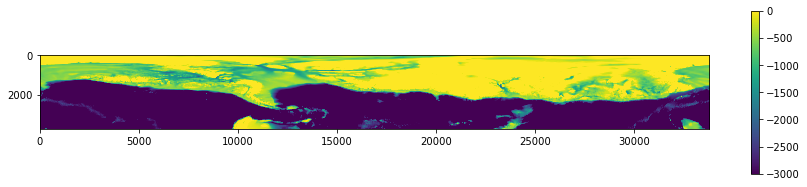

In [20]:
plt.clf()
plt.close()
plt.figure(figsize=(15,3))
plt.imshow(df_IBCSO.z,vmin=-3000,vmax=0)
plt.colorbar()

In [9]:
[lon_IBCSO,lat_IBCSO]=np.meshgrid(df_IBCSO.lon,df_IBCSO.lat)

In [10]:
lon_IBCSO.shape

(3757, 33812)

In [49]:
transformer2 = Transformer.from_crs(outProj, inProj)

In [12]:
x_IBCSO, y_IBCSO = transformer2.transform(lon_IBCSO, lat_IBCSO)

In [13]:
#This step takes 10 minutes+
depth_IBCSO_bed=griddata((x_IBCSO.ravel(),y_IBCSO.ravel()),np.asarray(df_IBCSO.z).ravel(),(xx,yy),method='nearest')



In [ ]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
plt.imshow(depth_IBCSO_bed,vmin=-3000,vmax=0)
# plt.pcolor(bathy_mask)
plt.colorbar()
plt.savefig('BathyIBCSO.png', dpi = 1200)

# Difference IBCSO - bedmachine

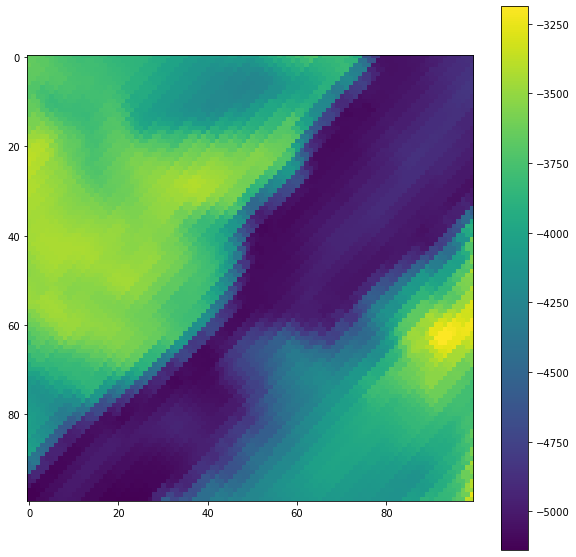

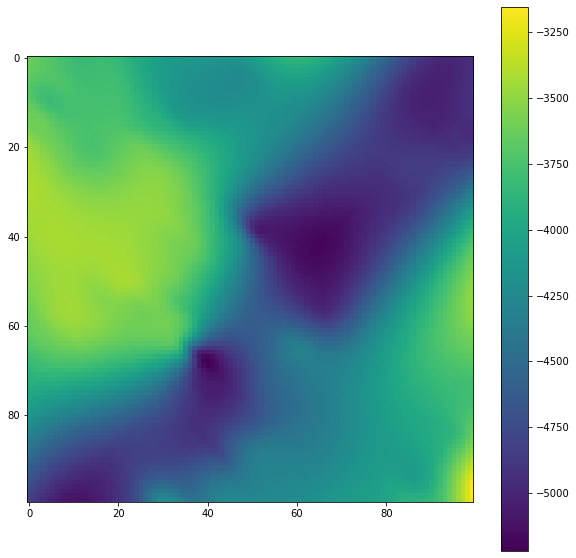

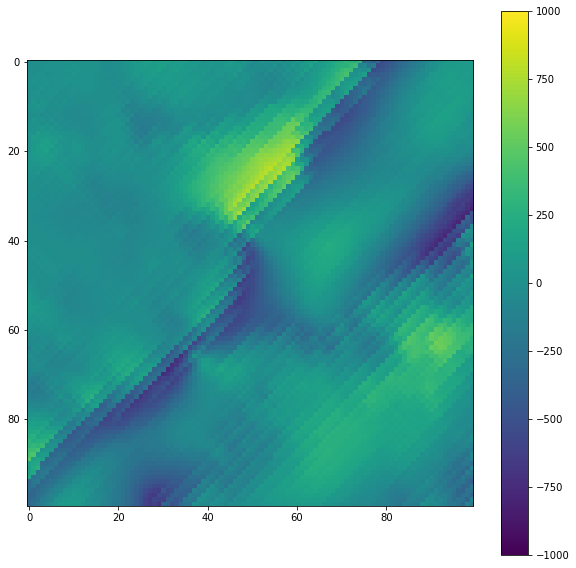

In [67]:
plt.clf()
plt.close()
plt.figure(figsize=(10,10))
ix1=1000
ix2=1100
iy1=1000
iy2=1100
plt.imshow(depth_IBCSO_bed[ix1:ix2,iy1:iy2])#,vmin=-3000,vmax=0)
plt.colorbar()
plt.show()
plt.figure(figsize=(10,10))
plt.imshow(df.bed[ix1:ix2,iy1:iy2])#,vmin=-3000,vmax=0)
plt.colorbar()
plt.show()
plt.figure(figsize=(10,10))
plt.imshow(depth_IBCSO_bed[ix1:ix2,iy1:iy2]-df.bed[ix1:ix2,iy1:iy2],vmin=-1000,vmax=1000)
# plt.pcolor(bathy_mask)
plt.colorbar()

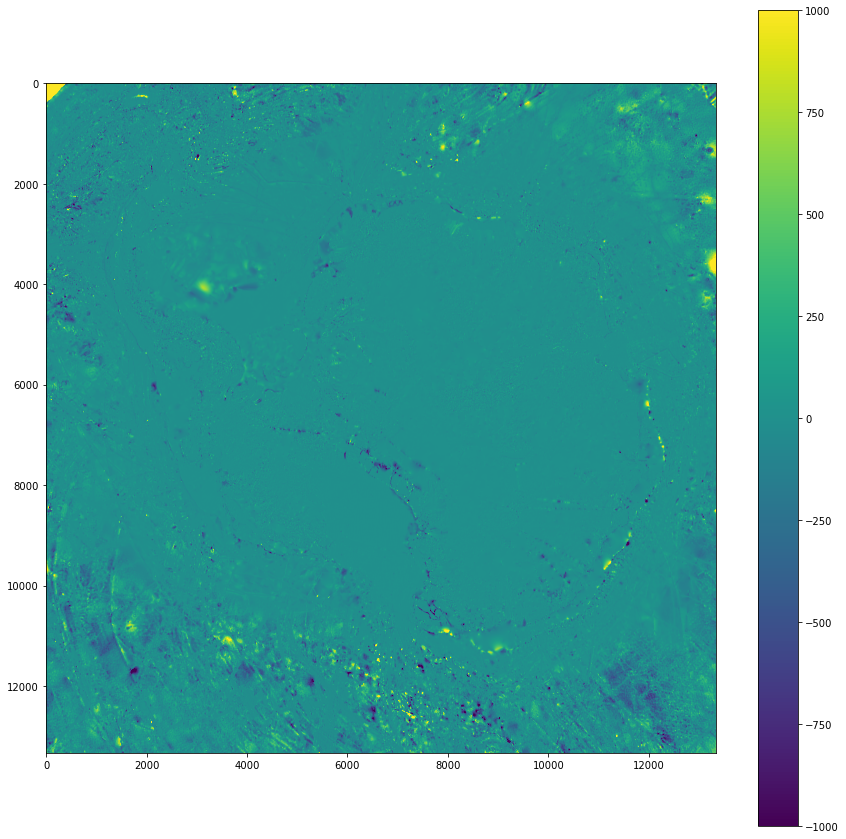

In [68]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
plt.imshow(depth_IBCSO_bed-df.bed,vmin=-1000,vmax=1000)
# plt.pcolor(bathy_mask)
plt.colorbar()
# plt.savefig('BathyIBCSOminusBedmachine.png', dpi = 1200)

# 2) Roughness

In [23]:
! pwd

/Users/micheltsamados/My Drive/ADMINISTRATION/ESA_ITT_ALBATROS_Tides/PM2_20211201


In [23]:
# ! ls /Volumes/Roughness/Arctic/Climatology/

In [15]:
# path2='/Users/micheltsamados/Documents/Data/MISR/MISR_roughness/Antarctic/'
path2='/Volumes/Roughness/Antarctica/No SZA/2017/10/'

In [14]:
! ls /Users/micheltsamados/Documents/Data/MISR/MISR_roughness/Antarctic/

ls: /Users/micheltsamados/Documents/Data/MISR/MISR_roughness/Antarctic/: No such file or directory


In [17]:
# import pickle


# with open(path2+'Roughness Antarctica 2017_32bit.pkl', 'rb') as f:
#     data_roughness = pickle.load(f)

In [16]:
import h5py

def LoadH5(h5name, h5file):
    HDF5 = h5file.get(h5name)
    NP = np.array(HDF5)
    return NP

In [17]:
# hf = h5py.File(path2+'October 2010_2016 Roughness_New.h5', 'r')
hf = h5py.File(path2+'October 2017 Roughness.h5', 'r')

In [20]:
hf['Stdev'].keys()

<KeysViewHDF5 ['Count_2D_svm']>

In [69]:
# hf_old = h5py.File(path2+'AA Roughness 2017 Binned new.hdf', 'r')

In [21]:
# lat_edge = LoadH5('GeoLocation/Latitude', hf)
# lon_edge = LoadH5('GeoLocation/Longitude', hf)
# roughness = LoadH5('Roughness/Roughness_2D_svm', hf)
# count = LoadH5('Count/Count_2D_svm', hf)

In [23]:
#3mins+
x_edge = LoadH5('GeoLocation/x', hf)
y_edge = LoadH5('GeoLocation/y', hf)
roughness = LoadH5('Roughness/Roughness_2D_svm', hf)
count = LoadH5('Count/Count_2D_svm', hf)
std = LoadH5('Stdev/Count_2D_svm', hf)

In [24]:
hf.keys()

<KeysViewHDF5 ['CV', 'Count', 'GeoLocation', 'Roughness', 'Stdev']>

In [25]:
hf['GeoLocation'].keys()

<KeysViewHDF5 ['Latitude', 'Longitude', 'x', 'y']>

In [26]:
x_edge.shape

(8000, 8000)

In [27]:
roughness.shape

(8000, 8000)

In [21]:
# count

In [28]:
EASE2 = "+proj=laea +lon_0=0 +lat_0=-90 +x_0=0 +y_0=0 +ellps=WGS84 +towgs84=0,0,0,0,0,0,0 +units=m +no_defs"
WGS84 = "+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs"
transformer3 = Transformer.from_crs(EASE2,WGS84)
lon_MISR, lat_MISR = transformer3.transform(x_edge, y_edge) #EASE2 to WGS84



In [29]:
x_MISR, y_MISR = transformer2.transform(lon_MISR, lat_MISR) #WGS84 to PS(bedmachine) 

In [30]:
roughness_bed=griddata((x_MISR.ravel(),y_MISR.ravel()),np.asarray(roughness).ravel(),(xx,yy),method='nearest')



In [53]:
xx.shape

(13333, 13333)

In [31]:
x_MISR.shape

(8000, 8000)

In [76]:
# plt.clf()
# plt.close()
# plt.figure(figsize=(15,15))
# plt.imshow(roughness_bed,vmin=0,vmax=0.5)
# # plt.pcolor(bathy_mask)
# plt.colorbar()

In [70]:
r_grad = np.gradient(roughness_bed)
roughness_grad=r_grad[0]**2.+r_grad[1]**2.



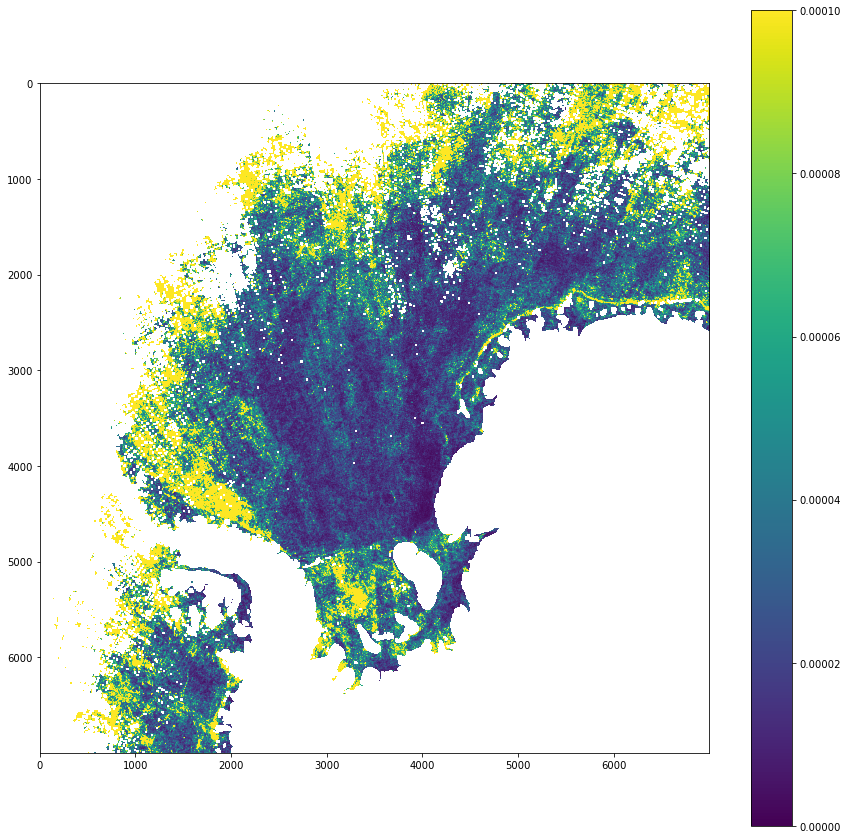

In [71]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
ix1=0
ix2=7000
iy1=1000
iy2=8000
plt.imshow(roughness_grad[ix1:ix2,iy1:iy2],vmin=0,vmax=1e-4)
# plt.pcolor(bathy_mask)
plt.colorbar()
# plt.savefig('RoughnessClimGrad_zoom_small.png', dpi = 400)

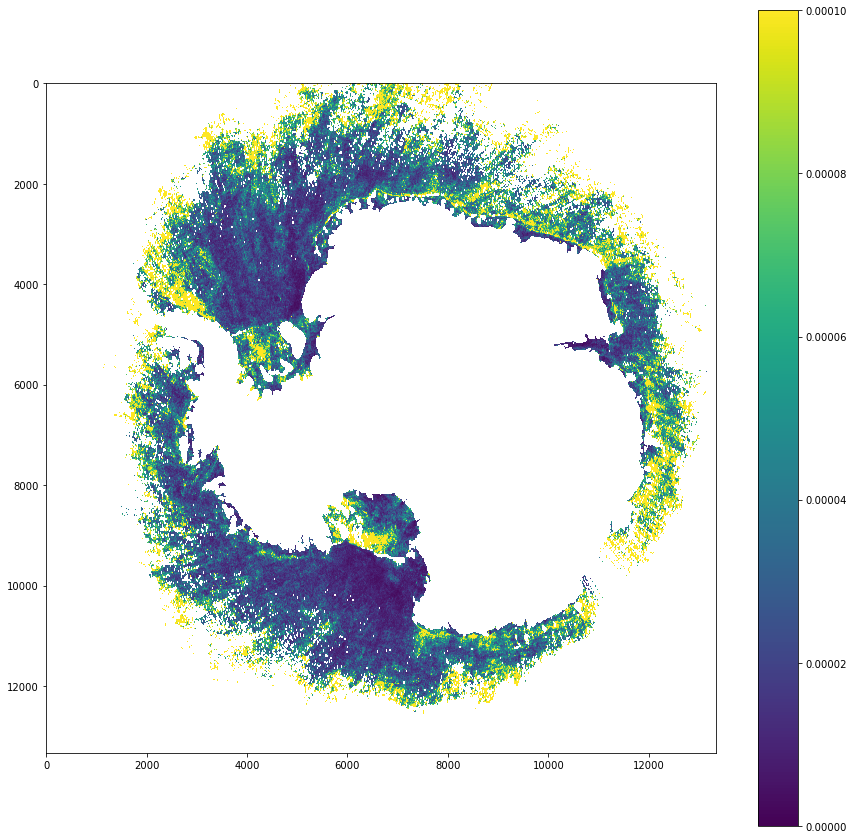

In [141]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
plt.imshow(roughness_grad,vmin=0,vmax=1e-4)
# plt.pcolor(bathy_mask)
plt.colorbar()
# plt.savefig('RoughnessClimGrad_small.png', dpi = 400)

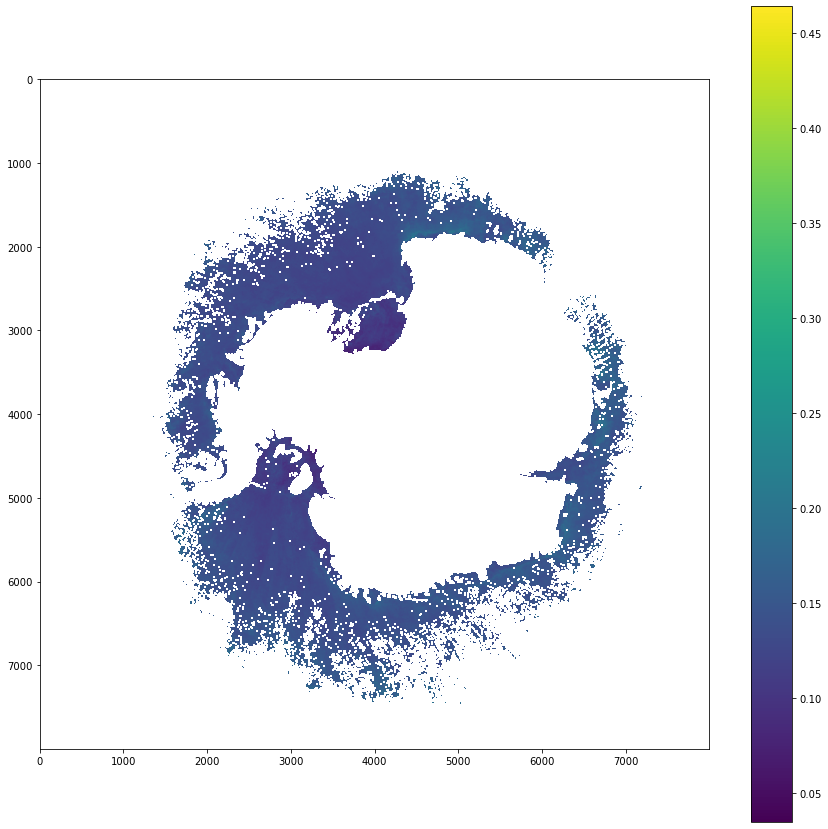

In [99]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
plt.imshow(roughness)#,vmin=-3000,vmax=0)
plt.colorbar()

In [ ]:
#Read pkl for month + year 

In [149]:
! ls -lrt /Volumes/Antarctica/No\ SZA/2017/10

total 52940800
-rwx------  1 micheltsamados  staff    35160436  2 Feb 02:54 MISR_ARCTIC_ROUGHNESS_20171030_P074_O095043_135_174.hdf
-rwx------  1 micheltsamados  staff    35204563  2 Feb 02:54 MISR_ARCTIC_ROUGHNESS_20171030_P090_O095044_135_174.hdf
-rwx------  1 micheltsamados  staff    36141464  2 Feb 02:55 MISR_ARCTIC_ROUGHNESS_20171030_P227_O095038_135_175.hdf
-rwx------  1 micheltsamados  staff    35893801  2 Feb 02:55 MISR_ARCTIC_ROUGHNESS_20171031_P049_O095056_135_174.hdf
-rwx------  1 micheltsamados  staff    36384315  2 Feb 02:55 MISR_ARCTIC_ROUGHNESS_20171031_P106_O095045_135_174.hdf
-rwx------  1 micheltsamados  staff    35759773  2 Feb 02:56 MISR_ARCTIC_ROUGHNESS_20171030_P010_O095039_135_174.hdf
-rwx------  1 micheltsamados  staff    35823632  2 Feb 02:56 MISR_ARCTIC_ROUGHNESS_20171030_P026_O095040_135_174.hdf
-rwx------  1 micheltsamados  staff    36001052  2 Feb 02:56 MISR_ARCTIC_ROUGHNESS_20171030_P058_O095042_135_174.hdf
-rwx------  1 micheltsamados  staff    35900341  

In [46]:
! ls ~/Documents/Data/MISR/MISR_roughness/Antarctic

10_2017 Roughness.h5                 October 2010_2016 Roughness_New.h5
AA Roughness 2017 Binned new.hdf     Roughness Antarctica 2017_32bit.pkl
AA Roughness 2017 Binned.hdf         RoughnessAntarctic_10_2017_32bit.pkl


In [72]:
# pathtemp='/Volumes/Antarctica/No SZA/2017/10/'
pathtemp = '/Users/micheltsamados/Documents/Data/MISR/MISR_roughness/Antarctic/'
hftemp = h5py.File(pathtemp+'10_2017 Roughness.h5', 'r')

In [73]:
hftemp['Stdev'].keys()

<KeysViewHDF5 ['Count_2D_svm']>

In [74]:
# x_edge = LoadH5('GeoLocation/x', hftemp)
# y_edge = LoadH5('GeoLocation/y', hftemp)
roughness_201710 = LoadH5('Roughness/Roughness_2D_svm', hftemp)
count_201710 = LoadH5('Count/Count_2D_svm', hftemp)
std_201710 = LoadH5('Stdev/Count_2D_svm', hftemp)

In [75]:
#10 minutes+ 
roughness_201710_bed=griddata((x_MISR.ravel(),y_MISR.ravel()),np.asarray(roughness_201710).ravel(),(xx,yy),method='nearest')
count_201710_bed=griddata((x_MISR.ravel(),y_MISR.ravel()),np.asarray(count_201710).ravel(),(xx,yy),method='nearest')
std_201710_bed=griddata((x_MISR.ravel(),y_MISR.ravel()),np.asarray(std_201710).ravel(),(xx,yy),method='nearest')




In [112]:
xx.shape

(13333, 13333)

In [32]:
roughness_bed.shape

(13333, 13333)

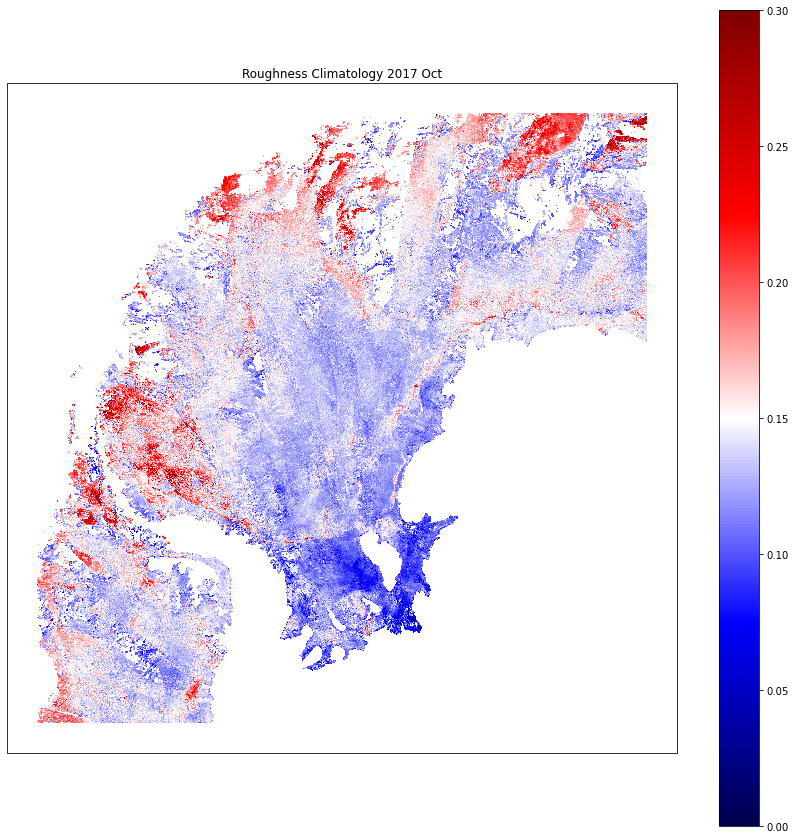

In [37]:
plt.figure(figsize=(15,15))

ax = plt.axes(projection = Projection)
# plt.title('Average Roughness 2016 (Mean)')
plt.title('Roughness Climatology 2017 Oct')

ix1=0
ix2=7000
iy1=1000
iy2=8000

levels = [-3000,-2500,-2000,-1500,-1000,-750,-500,-400,-300,-200,-150,-100,-80,-60,-50,-40,-30,-20,-10,0]
plt.contour(xtest2, ytest2, df.z, levels, vmin=-1000, vmax=0, linewidths=0.2, alpha=0.3, cmap='seismic')



plt.pcolormesh(xx[ix1:ix2,iy1:iy2], yy[ix1:ix2,iy1:iy2], roughness_bed[ix1:ix2,iy1:iy2], zorder=0 ,vmin=0, vmax=0.3, cmap='seismic')
# ax.add_feature(land_10m, zorder=1, edgecolor='black', linewidth=0.1)
plt.colorbar()
# plt.savefig('A_2016_Roughness_Mean_fine.png', dpi = 400)





In [38]:
df.bed.shape

(13333, 13333)

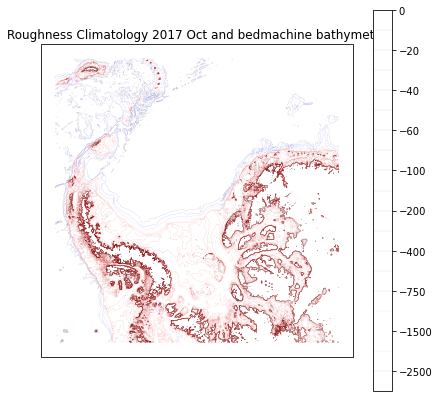

In [40]:
plt.figure(figsize=(7,7))

ax = plt.axes(projection = Projection)
# plt.title('Average Roughness 2016 (Mean)')
plt.title('Roughness Climatology 2017 Oct and bedmachine bathymetry')

ix1=0
ix2=7000
iy1=1000
iy2=8000

#CAA
# levels = [-3000,-2500,-2000,-1500,-1000,-750,-500,-400,-300,-200,-150,-100,-75,-50,-25,0]
#Russia
levels = [-3000,-2500,-2000,-1500,-1000,-750,-500,-400,-300,-200,-150,-100,-80,-60,-50,-40,-30,-20,-10,0]

# levels = np.arange(-1000, 0, 50)
plt.contour(xx[ix1:ix2,iy1:iy2], yy[ix1:ix2,iy1:iy2], df.bed[ix1:ix2,iy1:iy2], levels, vmin=-3000, vmax=0, linewidths=0.05, alpha=1., cmap='seismic')
plt.pcolormesh(xx[ix1:ix2,iy1:iy2], yy[ix1:ix2,iy1:iy2], roughness_bed[ix1:ix2,iy1:iy2], zorder=0 ,vmin=0, vmax=0.3, cmap='seismic')

# plt.pcolormesh(xtest2[ix1:ix2,iy1:iy2], ytest2[ix1:ix2,iy1:iy2], df.z[ix1:ix2,iy1:iy2], zorder=0 ,vmin=-1000, vmax=0, cmap='seismic')
# ax.add_feature(land_10m, zorder=1, edgecolor='black', linewidth=0.02)
plt.colorbar()
plt.savefig('Roughness_Bedmachine_bathy_Weddell_contourf_large_alpha.png', dpi = 1400)
# plt.savefig('Roughness_IBCAO_bathy_Russia_contourf_large_alpha.png', dpi = 1400)






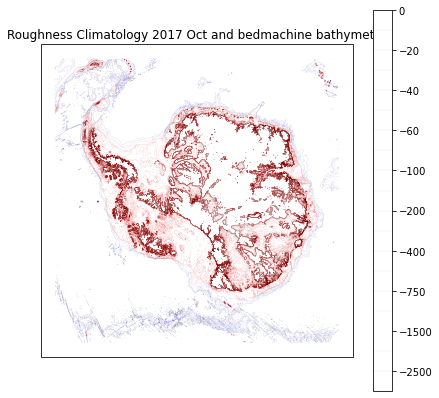

In [41]:
plt.figure(figsize=(7,7))

ax = plt.axes(projection = Projection)
# plt.title('Average Roughness 2016 (Mean)')
plt.title('Roughness Climatology 2017 Oct and bedmachine bathymetry')

#CAA
# levels = [-3000,-2500,-2000,-1500,-1000,-750,-500,-400,-300,-200,-150,-100,-75,-50,-25,0]
#Russia
levels = [-3000,-2500,-2000,-1500,-1000,-750,-500,-400,-300,-200,-150,-100,-80,-60,-50,-40,-30,-20,-10,0]

# levels = np.arange(-1000, 0, 50)
plt.pcolormesh(xx, yy, roughness_bed, zorder=0 ,vmin=0, vmax=0.3, cmap='seismic')
plt.contour(xx, yy, df.bed, levels, vmin=-3000, vmax=0, linewidths=0.05, alpha=1., cmap='seismic')


# plt.pcolormesh(xtest2[ix1:ix2,iy1:iy2], ytest2[ix1:ix2,iy1:iy2], df.z[ix1:ix2,iy1:iy2], zorder=0 ,vmin=-1000, vmax=0, cmap='seismic')
# ax.add_feature(land_10m, zorder=1, edgecolor='black', linewidth=0.02)
plt.colorbar()
plt.savefig('Roughness_Bedmachine_bathy_panAntarctic_contourf_large.png', dpi = 1400)







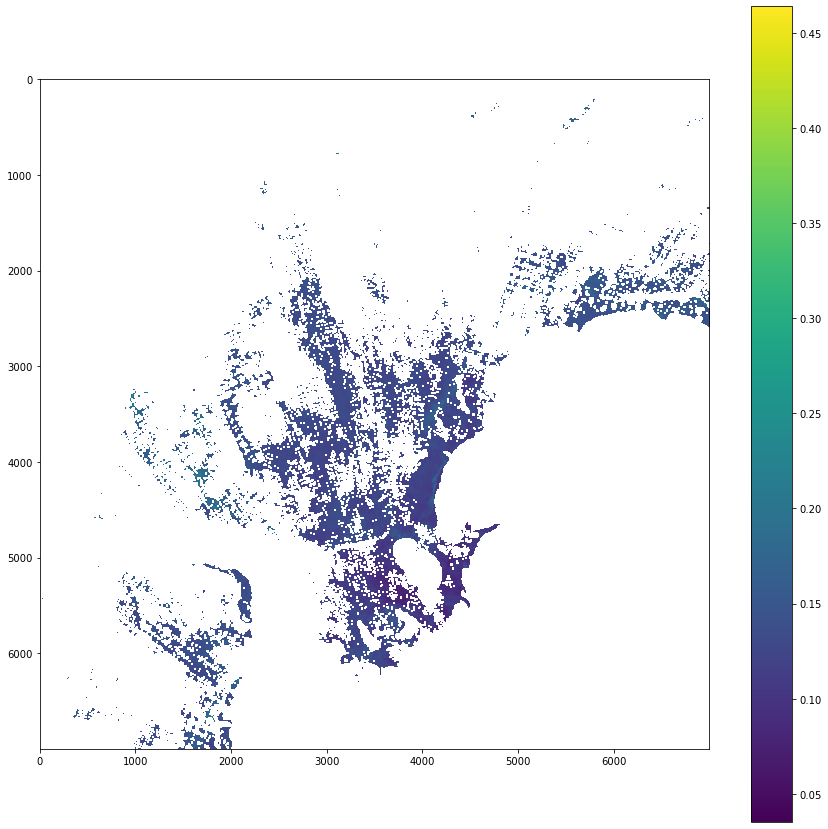

In [34]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
ix1=0
ix2=7000
iy1=1000
iy2=8000
plt.imshow(roughness_bed[ix1:ix2,iy1:iy2])#,vmin=0,vmax=0.5)
# plt.pcolor(bathy_mask)
plt.colorbar()
# plt.savefig('count_201710_zoom_small.png', dpi = 400)

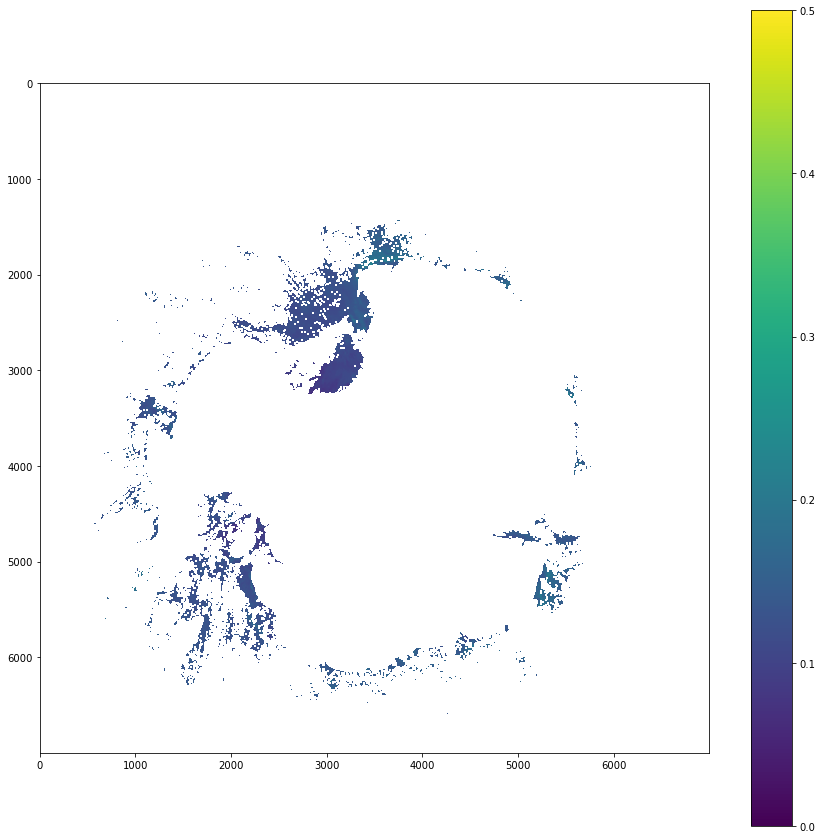

In [77]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
ix1=0
ix2=7000
iy1=1000
iy2=8000
plt.imshow(roughness_201710[ix1:ix2,iy1:iy2],vmin=0,vmax=0.5)
# plt.pcolor(bathy_mask)
plt.colorbar()
# plt.savefig('count_201710_zoom_small.png', dpi = 400)

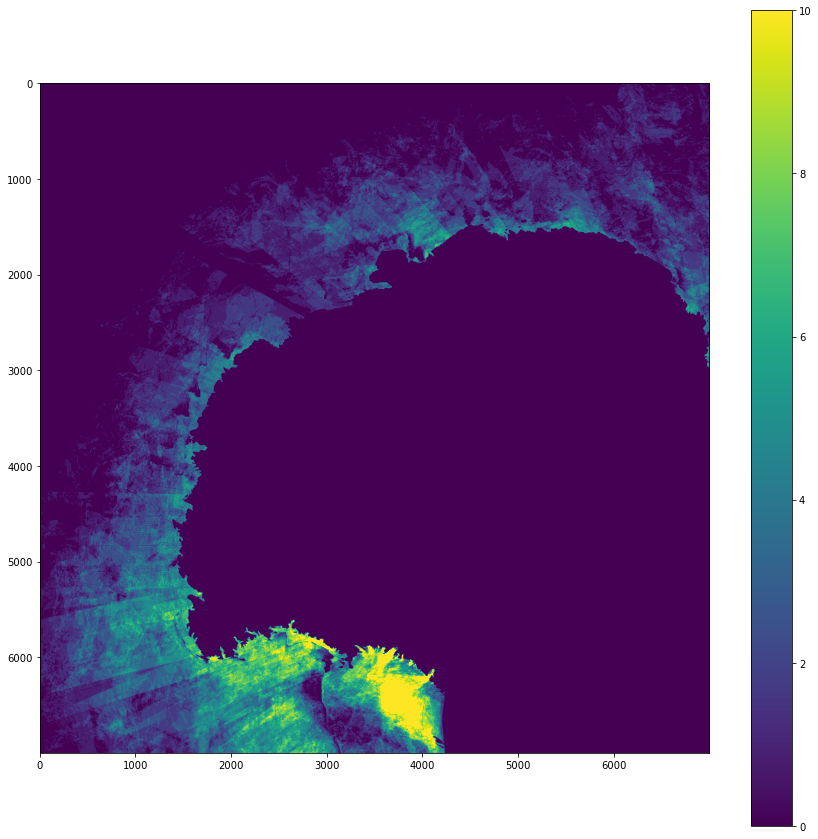

In [183]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
# ix1=2500 #0
# ix2=4500 #7000
# iy1=4000 #1000
# iy2=6000 #8000
ix1=0
ix2=7000
iy1=1000
iy2=8000
# plt.imshow(count_201710_bed,vmin=0,vmax=10)
plt.imshow(count_201710_bed[ix1:ix2,iy1:iy2],vmin=0,vmax=10)
# plt.pcolor(bathy_mask)
plt.colorbar()
plt.savefig('count_201710_zoom_small.png', dpi = 400)

In [99]:
std_201710[::-1].shape

(8000, 8000)

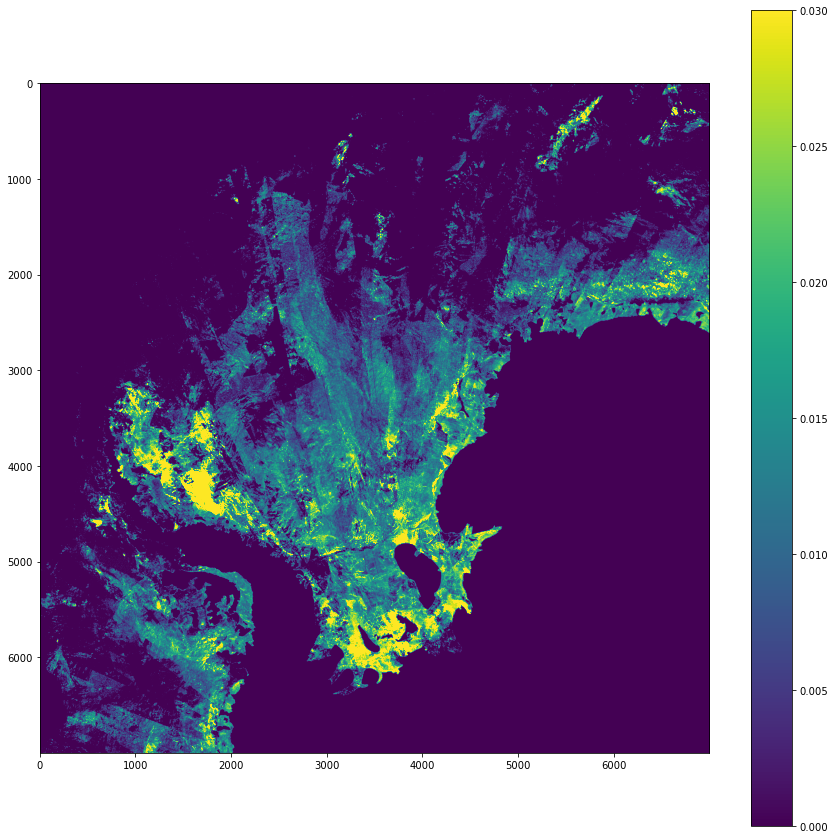

In [184]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
ix1=0
ix2=7000
iy1=1000
iy2=8000
plt.imshow((std_201710_bed)[ix1:ix2,iy1:iy2],vmin=0,vmax=0.03)
# plt.imshow(np.swapaxes(std_201710,0,1))#,vmin=0,vmax=10)
# plt.imshow(std_201710_bed)
# plt.pcolor(bathy_mask)
plt.colorbar()
# plt.savefig('std_201710_tiny.png', dpi = 400)

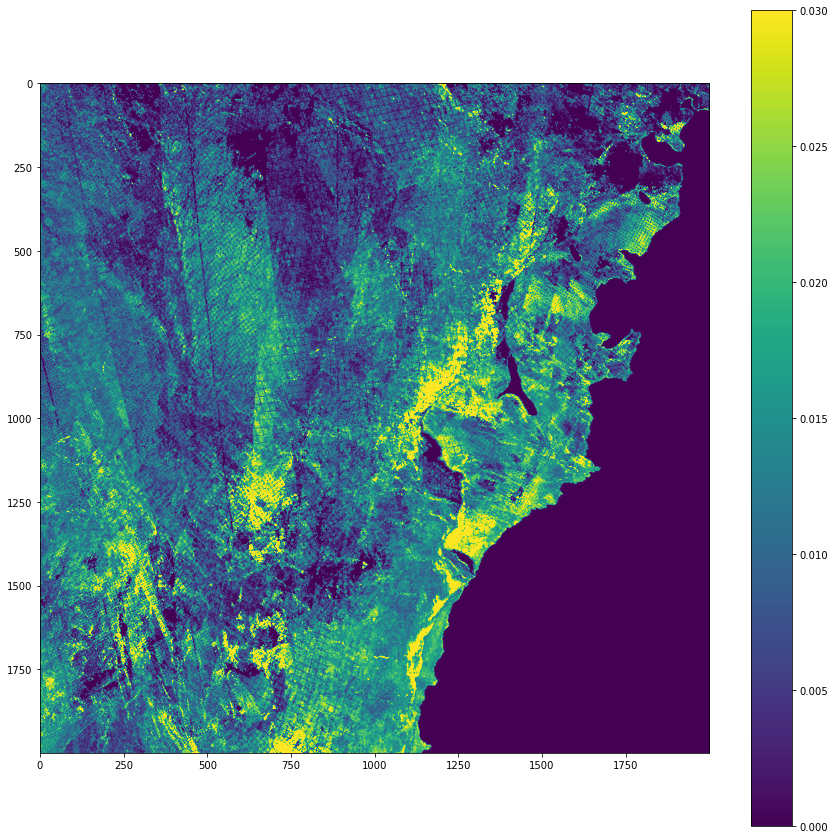

In [124]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
ix1=0
ix2=7000
iy1=1000
iy2=8000
plt.imshow((std_201710_bed)[ix1:ix2,iy1:iy2],vmin=0,vmax=0.03)
# plt.imshow(np.swapaxes(std_201710,0,1))#,vmin=0,vmax=10)
# plt.imshow(std_201710_bed)
# plt.pcolor(bathy_mask)
plt.colorbar()
plt.savefig('std_201710_tiny.png', dpi = 400)

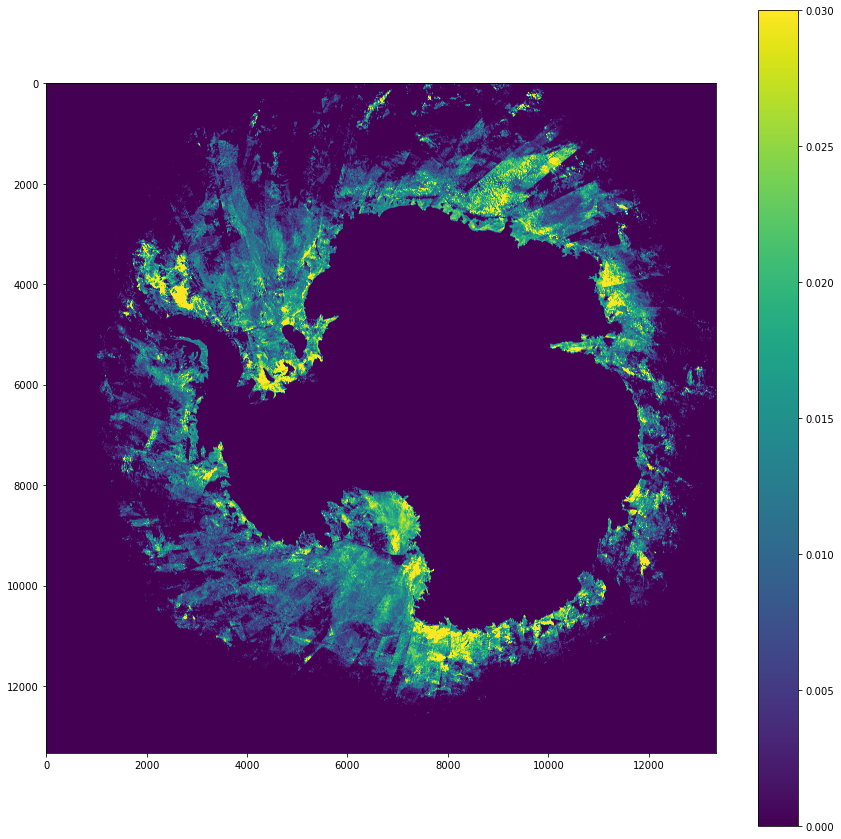

In [158]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
ix1=2500 #0
ix2=4500 #7000
iy1=4000 #1000
iy2=6000 #8000
plt.imshow((std_201710_bed),vmin=0,vmax=0.03)
# plt.imshow(np.swapaxes(std_201710,0,1))#,vmin=0,vmax=10)
# plt.imshow(std_201710_bed)
# plt.pcolor(bathy_mask)
plt.colorbar()
# plt.savefig('std_201710_tiny.png', dpi = 400)

In [179]:
# ax = plt.axes(projection = Projection)
# plt.title('Count 201710')
# ix1=0
# ix2=7000
# iy1=1000
# iy2=8000
# plt.pcolormesh(xx[ix1:ix2,iy1:iy2], yy[ix1:ix2,iy1:iy2], count_201710_bed[ix1:ix2,iy1:iy2], zorder=0 ,vmin=0, vmax=10, cmap='seismic')
# ax.add_feature(land_10m, zorder=1, edgecolor='black', linewidth=0.1)
# plt.colorbar()
# plt.savefig('Count_201710_small.png', dpi = 400)




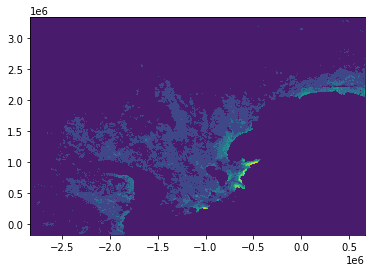

In [172]:
plt.contourf(xx[ix1:ix2,iy1:iy2], yy[ix1:ix2,iy1:iy2],count_201710_bed[ix1:ix2,iy1:iy2])

In [ ]:
# counts below roughness thresholds 

In [129]:
ROUGHNESS_SWATHS_IN = '/Users/micheltsamados/Documents/Data/MISR/MISR_roughness/Antarctic/'

#3 minutes
year='2017'
MONTH='10'

df = load(ROUGHNESS_SWATHS_IN+'RoughnessAntarctic_{}_{}_32bit.pkl'.format(MONTH, year))
#             df = load(ROUGHNESS_SWATHS_IN+year+'/'+MONTH+'/'+'RoughnessAntarctic_{}{}_32bit.pkl'.format('Oct', year))
xs = df['xs'].to_numpy(dtype=np.float)
ys = df['ys'].to_numpy(dtype=np.float)
roughnesses = df['roughness'].to_numpy(dtype=np.float)
date_times = df['date_times'].to_numpy(dtype=np.float)


# EASE-2 Properties # Edges
x_min = -4000000.0
y_min = -4000000.0
x_max = 4000000.0
y_max = 4000000.0

resolution_x = 1000
resolution_y = 1000

n_x = ((x_max - x_min) / resolution_x) + 1
n_y = ((y_max - y_min) / resolution_y) + 1

#5 minutes
count = binned_statistic_2d(xs, ys, roughnesses,
                     statistic = 'count',
                     bins = [np.linspace(x_min, x_max, int(n_x)), np.linspace(y_min, y_max, int(n_y))],
                     range = [[x_min, x_max], [y_min, y_max]])
print('Calculated Count')





/var/folders/ph/23v7nk_n1jsckxstn7cgsfb80000gr/T/ipykernel_16334/2754177400.py:9: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  xs = df['xs'].to_numpy(dtype=np.float)
/var/folders/ph/23v7nk_n1jsckxstn7cgsfb80000gr/T/ipykernel_16334/2754177400.py:10: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ys = df['ys'].to_numpy(dtype=np.float)
/var/

Calculated Count


NameError: name 'Count_Less' is not defined

(array([2.960000e+03, 1.160100e+04, 2.107100e+04, 3.318600e+04,
        4.872300e+04, 6.384900e+04, 8.620800e+04, 1.205020e+05,
        1.645680e+05, 2.145990e+05, 2.613310e+05, 3.191400e+05,
        4.039850e+05, 5.280640e+05, 6.801590e+05, 8.646680e+05,
        1.083009e+06, 1.329866e+06, 1.607549e+06, 1.872216e+06,
        2.094092e+06, 2.252970e+06, 2.307773e+06, 2.238545e+06,
        2.083966e+06, 1.856299e+06, 1.635554e+06, 1.406311e+06,
        1.198299e+06, 1.003239e+06, 8.263620e+05, 6.790720e+05,
        5.495530e+05, 4.440200e+05, 3.624120e+05, 3.038130e+05,
        2.596240e+05, 2.216980e+05, 1.892590e+05, 1.578740e+05,
        1.311420e+05, 1.108790e+05, 9.355800e+04, 7.883600e+04,
        6.690200e+04, 5.646900e+04, 4.742200e+04, 4.072000e+04,
        3.509200e+04, 3.013200e+04, 2.572900e+04, 2.204200e+04,
        1.931600e+04, 1.678300e+04, 1.432000e+04, 1.235800e+04,
        1.056800e+04, 9.321000e+03, 8.074000e+03, 7.043000e+03,
        5.945000e+03, 4.892000e+03, 3.92

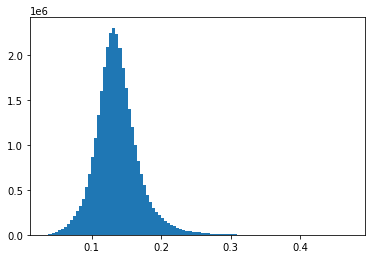

In [136]:
plt.hist(roughnesses,bins=100)

In [137]:
count_to = binned_statistic_2d(xs, ys, roughnesses[roughnesses<0.1],
                     statistic = 'count',
                     bins = [np.linspace(x_min, x_max, int(n_x)), np.linspace(y_min, y_max, int(n_y))],
                     range = [[x_min, x_max], [y_min, y_max]])
print('Calculated Count to')

Calculated Count to


In [138]:
count_greater = binned_statistic_2d(xs, ys, roughnesses[roughnesses>0.3],
                     statistic = 'count',
                     bins = [np.linspace(x_min, x_max, int(n_x)), np.linspace(y_min, y_max, int(n_y))],
                     range = [[x_min, x_max], [y_min, y_max]])
print('Calculated Count Greater')

Calculated Count Greater


In [139]:
count_to = binned_statistic_2d(xs, ys, roughnesses[(roughnesses>0.1)&(roughnesses<0.3)],
                     statistic = 'count',
                     bins = [np.linspace(x_min, x_max, int(n_x)), np.linspace(y_min, y_max, int(n_y))],
                     range = [[x_min, x_max], [y_min, y_max]])
print('Calculated Count To')

Calculated Count To


In [142]:
# std = binned_statistic_2d(xs, ys, roughnesses,
#                      statistic = 'std',
#                      bins = [np.linspace(x_min, x_max, int(n_x)), np.linspace(y_min, y_max, int(n_y))],
#                      range = [[x_min, x_max], [y_min, y_max]])
# print('Calculated Std')

In [133]:


#5 minutes

xx_edge, yy_edge = np.meshgrid(mean.x_edge, mean.y_edge)

# Go from Pixel Edges to Pixel Centres
xx_cent, yy_cent = np.meshgrid(np.add(mean.x_edge[:-1], resolution_x/2),
                               np.add(mean.y_edge[:-1], resolution_y/2))

# fig4 = plt.figure(linewidth=0.1)
# fig4.subplots_adjust(top=0.8)


# gs = fig4.add_gridspec(3, 4)

# f4_ax1 = fig4.add_subplot(gs[:, :-1], projection = Projection)
# f4_ax1.outline_patch.set_linewidth(0.5)
# f4_ax1.set_title('Mean Roughness (m)', fontsize=12, y=0.99)
# p1 = f4_ax1.pcolorfast(xx_edge, yy_edge, mean.statistic.T, zorder=0 ,vmin=0, vmax=0.4, cmap='seismic')
# f4_ax1.add_feature(land_10m, zorder=1, edgecolor='black', linewidth=0.05)
# fig4.colorbar(p1, use_gridspec = True, ax=f4_ax1)

# f4_ax2 = fig4.add_subplot(gs[0, -1], projection = Projection)
# f4_ax2.outline_patch.set_linewidth(0.5)
# f4_ax2.set_title('Count x <= 0.1', fontsize=8, y=0.93)
# p2 = f4_ax2.pcolorfast(xx_edge, yy_edge, count_less.statistic.T/count.statistic.T, zorder=0, vmin=0, vmax=3, cmap='afmhot') 
# f4_ax2.add_feature(land_10m, zorder=1, edgecolor='black', linewidth=0.05)
# fig4.colorbar(p2, use_gridspec = True, ax=f4_ax2)

# f4_ax3 = fig4.add_subplot(gs[-2, -1], projection = Projection)
# f4_ax3.outline_patch.set_linewidth(0.5)
# f4_ax3.set_title('Count 0.1 < x < 0.3', fontsize=8, y=0.93)
# p3 = f4_ax3.pcolorfast(xx_edge, yy_edge, count_to.statistic.T/count.statistic.T, zorder=0, vmin=0, vmax=3, cmap='afmhot')
# f4_ax3.add_feature(land_10m, zorder=1, edgecolor='black', linewidth=0.05)
# fig4.colorbar(p3, use_gridspec = True, ax=f4_ax3)

# f4_ax4 = fig4.add_subplot(gs[-1, -1], projection = Projection)
# f4_ax4.outline_patch.set_linewidth(0.5)
# f4_ax4.set_title('Count x >= 0.3', fontsize=8, y=0.93)
# p4 = f4_ax4.pcolorfast(xx_edge, yy_edge, count_greater.statistic.T/count.statistic.T, zorder=0, vmin=0, vmax=3, cmap='afmhot')
# f4_ax4.add_feature(land_10m, zorder=1, edgecolor='black', linewidth=0.05)
# fig4.colorbar(p4, use_gridspec = True, ax=f4_ax4)

# fig4.suptitle('{} {} \n'.format(MONTH, year), fontsize=20, y=0.96)
# plt.savefig('count_norm_range_predt_sns_realigned_stdold_HighRes_{}_{}_Roughness_Mean_gridspec_same.png'.format(MONTH, year), dpi = 1200)

# plt.cla()
# plt.clf()
# plt.close() 

Calculated Count Less


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.


KeyboardInterrupt



In [131]:
count.statistic.shape

(8000, 8000)

In [132]:
x_MISR.shape

(8000, 8000)

In [145]:
np.asarray(count).shape

(4,)

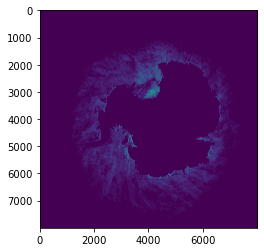

In [164]:
plt.imshow(np.asarray(count.statistic).T)

In [146]:
#15 minutes 
count_201710_bed=griddata((x_MISR.ravel(),y_MISR.ravel()),np.asarray(count.statistic).ravel(),(xx,yy),method='nearest')
print('1')
count_less_201710_bed=griddata((x_MISR.ravel(),y_MISR.ravel()),np.asarray(count_less.statistic).ravel(),(xx,yy),method='nearest')
print('2')
count_to_201710_bed=griddata((x_MISR.ravel(),y_MISR.ravel()),np.asarray(count_to.statistic).ravel(),(xx,yy),method='nearest')
print('3')
count_greater_201710_bed=griddata((x_MISR.ravel(),y_MISR.ravel()),np.asarray(count_greater.statistic).ravel(),(xx,yy),method='nearest')
# std_201710_bed=griddata((x_MISR.ravel(),y_MISR.ravel()),np.asarray(std).ravel(),(xx,yy),method='nearest')


1
2
3


In [156]:
count_201710_bed.shape

(13333, 13333)

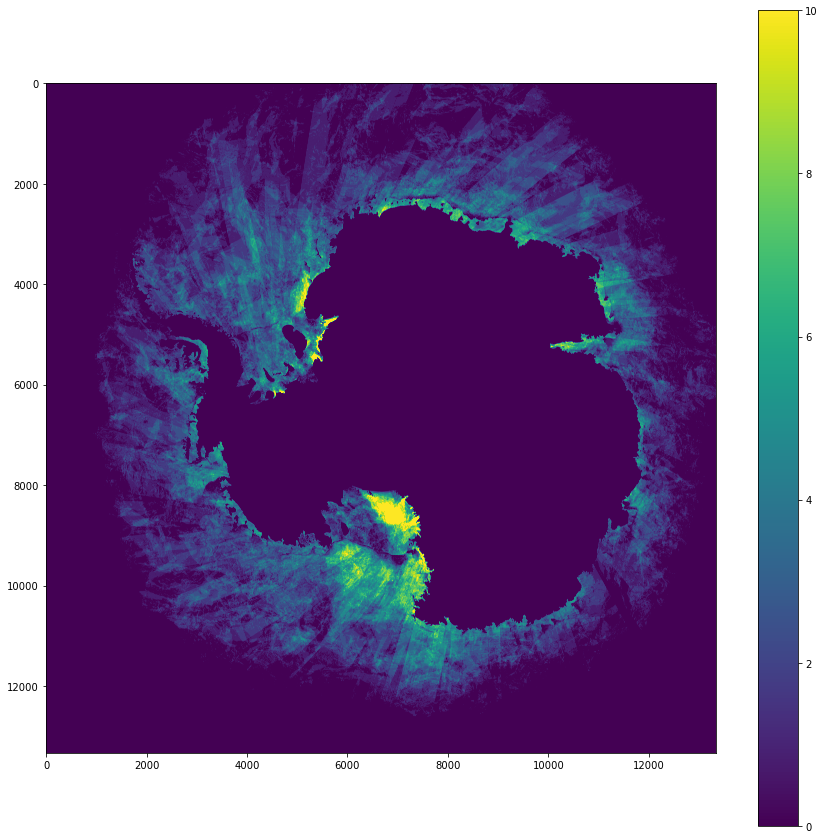

In [182]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
ix1=2500 #0
ix2=4500 #7000
iy1=4000 #1000
iy2=6000 #8000
# plt.imshow((count_201710_bed.T[::-1,::-1])[ix1:ix2,iy1:iy2],vmin=0,vmax=10)
plt.imshow((count_201710_bed.T[::-1,::-1]),vmin=0,vmax=10)
# plt.imshow((count_201710_bed).T[::-1,::-1],vmin=0,vmax=5)
# plt.imshow(np.swapaxes(std_201710,0,1))#,vmin=0,vmax=10)
# plt.imshow(std_201710_bed)
# plt.pcolor(bathy_mask)
plt.colorbar()
# plt.savefig('count_201710_bed_tiny.png', dpi = 400)
plt.savefig('count_201710_bed_tiny.png', dpi = 400)

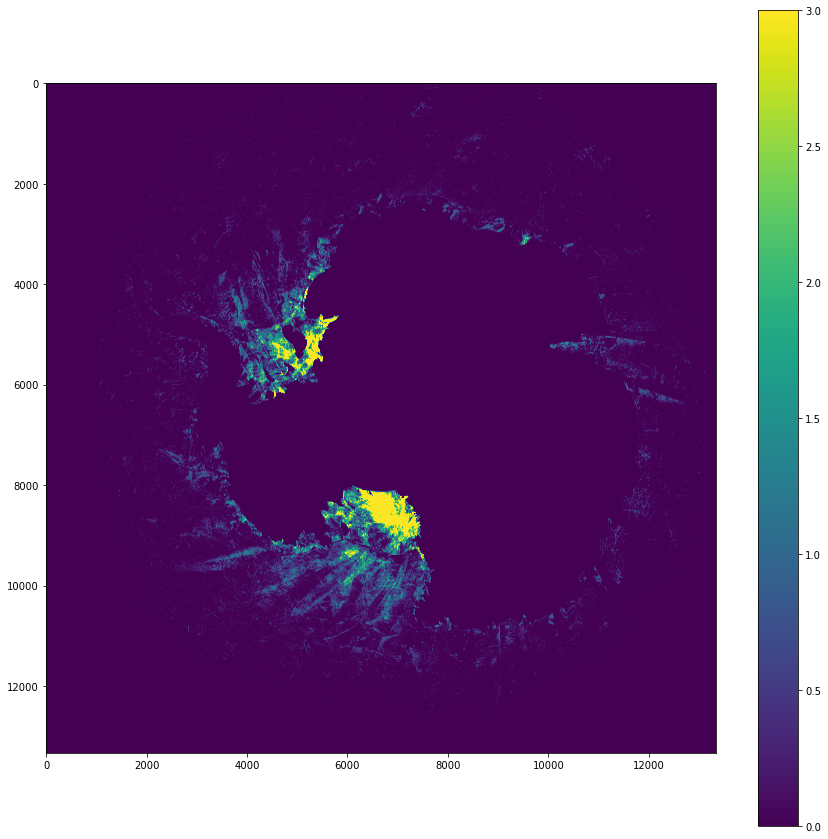

In [181]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
ix1=2500 #0
ix2=4500 #7000
iy1=4000 #1000
iy2=6000 #8000
# plt.imshow((count_less_201710_bed.T[::-1,::-1])[ix1:ix2,iy1:iy2],vmin=0,vmax=3)
plt.imshow((count_less_201710_bed.T[::-1,::-1]),vmin=0,vmax=3)
# plt.imshow(np.swapaxes(std_201710,0,1))#,vmin=0,vmax=10)
# plt.imshow(std_201710_bed)
# plt.pcolor(bathy_mask)
plt.colorbar()
# plt.savefig('count_less_201710_bed_tiny.png', dpi = 400)
plt.savefig('count_less_201710_bed.png', dpi = 400)

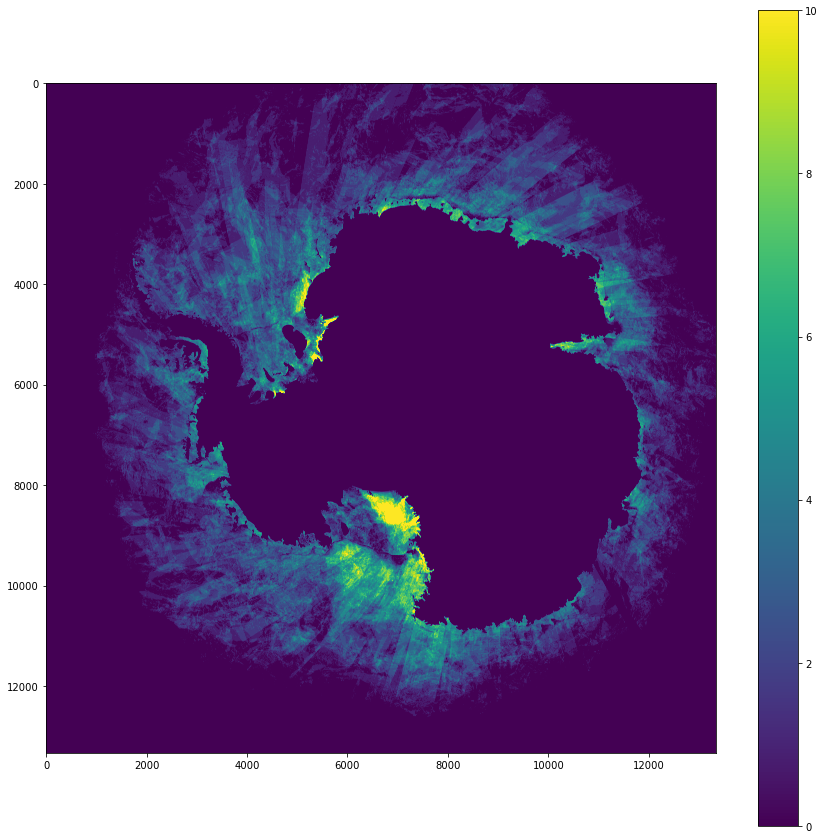

In [179]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
ix1=2500 #0
ix2=4500 #7000
iy1=4000 #1000
iy2=6000 #8000
# plt.imshow((count_to_201710_bed.T[::-1,::-1])[ix1:ix2,iy1:iy2],vmin=0,vmax=10)
plt.imshow((count_to_201710_bed.T[::-1,::-1]),vmin=0,vmax=10)
# plt.imshow(count_to_201710_bed.T,vmin=0,vmax=5)
# plt.imshow(np.swapaxes(std_201710,0,1))#,vmin=0,vmax=10)
# plt.imshow(std_201710_bed)
# plt.pcolor(bathy_mask)
plt.colorbar()
# plt.savefig('count_to_201710_bed_tiny.png', dpi = 400)
plt.savefig('count_to_201710_bed.png', dpi = 400)

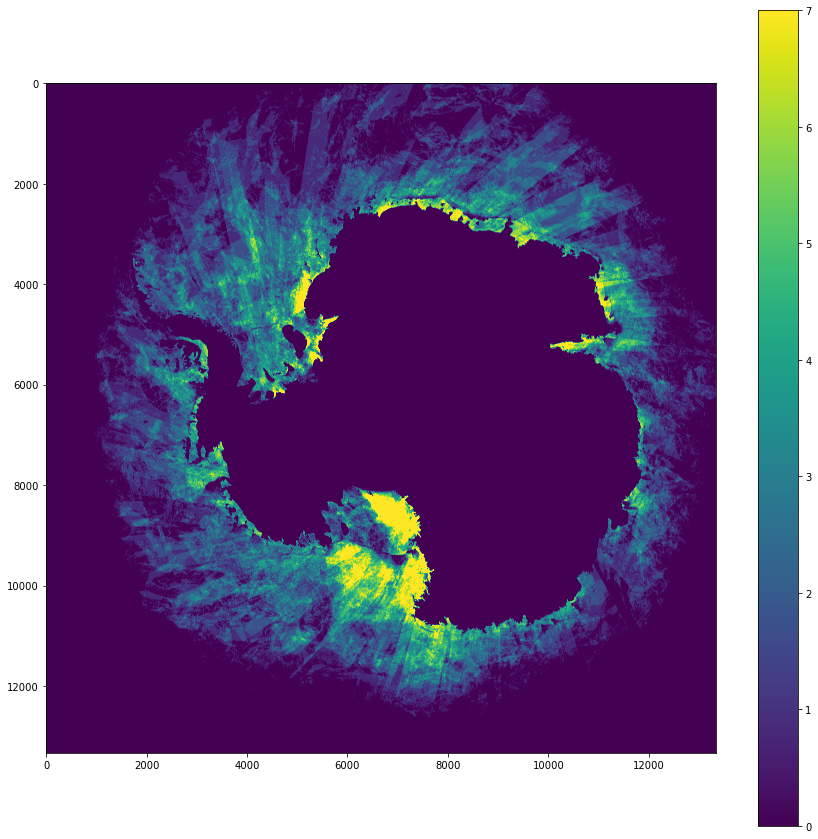

In [180]:
plt.clf()
plt.close()
plt.figure(figsize=(15,15))
ix1=2500 #0
ix2=4500 #7000
iy1=4000 #1000
iy2=6000 #8000
# plt.imshow((count_greater_201710_bed.T[::-1,::-1])[ix1:ix2,iy1:iy2],vmin=0,vmax=7)
plt.imshow((count_greater_201710_bed.T[::-1,::-1]),vmin=0,vmax=7)
# plt.imshow(np.swapaxes(std_201710,0,1))#,vmin=0,vmax=10)
# plt.imshow(std_201710_bed)
# plt.pcolor(bathy_mask)
plt.colorbar()
# plt.savefig('count_greater_201710_bed_tiny.png', dpi = 400)
plt.savefig('count_greater_201710_bed.png', dpi = 400)

# 3) Tides

In [185]:
! ls /Users/micheltsamados/Documents/Data/Tides

Tide_gauge_time_series
meanvelocity_FES2014_Antarctica_Sept2017.nc
meanvelocity_FES2014_Arctic_March2019.nc
tidal_dissipation_diags


In [186]:
path_tides='/Users/micheltsamados/Documents/Data/Tides/'
file_AA='meanvelocity_FES2014_Antarctica_Sept2017.nc'
# file_A=path_tides+'meanvelocity_FES2014_Arctic_March2019.nc'


data_tides=Dataset(path_tides+file_AA,"r")
# SIC=np.asarray(data_SIC.variables['sic'])
# bathy=data.variables['bed']

In [187]:
data_tides.variables.keys()

dict_keys(['longitude', 'latitude', 'MeanVelocity'])

In [188]:
tides=data_tides.variables['MeanVelocity']
tides_lon=data_tides.variables['longitude']
tides_lat=data_tides.variables['latitude']

In [189]:
print(tides_lon.shape)
tides.shape

(5761,)


(5761, 800)

In [190]:
tides_lon_g, tides_lat_g = np.meshgrid(np.asarray(tides_lon), np.asarray(tides_lat))

In [44]:
x_tides,y_tides=P(tides_lon_g,tides_lat_g)

In [45]:
np.asarray(tides_lon_g).shape

(800, 5761)

In [46]:
tides.shape

(5761, 800)

/Users/micheltsamados/miniconda3/envs/icesat2020/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1598: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  shading=shading)


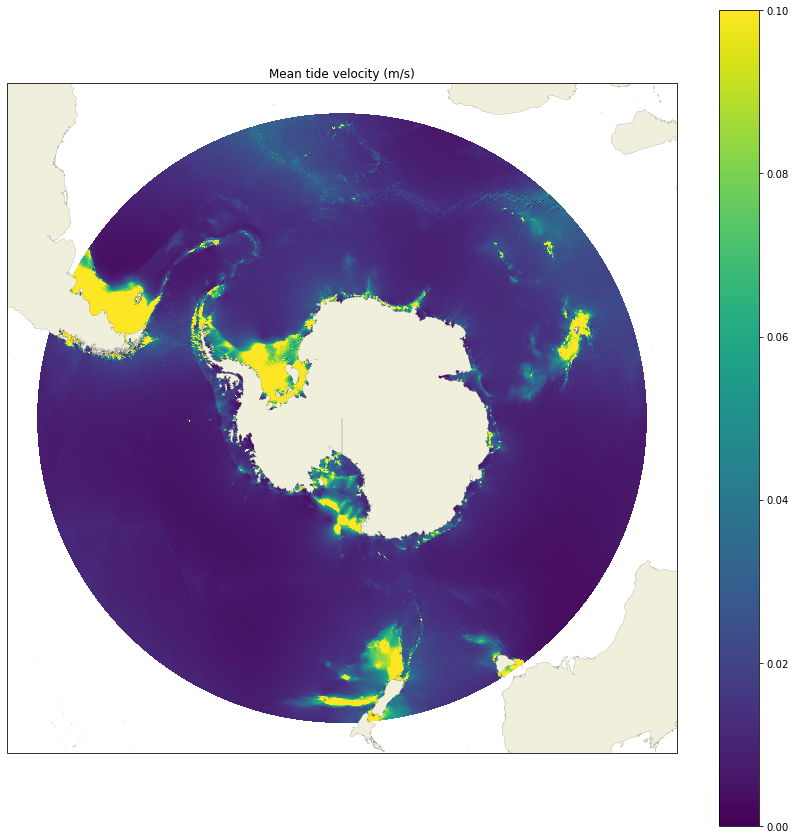

In [47]:
plt.figure(figsize=(15,15))

ax = plt.axes(projection = Projection)
plt.title('Mean tide velocity (m/s)')
s=2
plt.pcolormesh(x_tides[::s,::s], y_tides[::s,::s], tides[::s,::s].T, zorder=0 ,vmin=0, vmax=0.1)#, cmap='seismic')
ax.add_feature(land_10m, zorder=1, edgecolor='black', linewidth=0.1)
plt.colorbar()
# plt.savefig('MeanVelocityTides.png', dpi = 400)



# Tidal mixing 

In [42]:
! ls /Users/micheltsamados/Documents/Data/Tides/tidal_dissipation_diags/Antarctica

bottom_friction_row-2017.01.huv.nc    vertical_excursion-2017.01.huv.nc
bottom_friction_row-2017.01.huv.nc.gz vertical_excursion-2017.01.huv.nc.gz
bottom_friction_row-2017.02.huv.nc    vertical_excursion-2017.02.huv.nc
bottom_friction_row-2017.02.huv.nc.gz vertical_excursion-2017.02.huv.nc.gz
bottom_friction_row-2017.03.huv.nc    vertical_excursion-2017.03.huv.nc
bottom_friction_row-2017.03.huv.nc.gz vertical_excursion-2017.03.huv.nc.gz
bottom_friction_row-2017.04.huv.nc    vertical_excursion-2017.04.huv.nc
bottom_friction_row-2017.04.huv.nc.gz vertical_excursion-2017.04.huv.nc.gz
bottom_friction_row-2017.05.huv.nc    vertical_excursion-2017.05.huv.nc
bottom_friction_row-2017.05.huv.nc.gz vertical_excursion-2017.05.huv.nc.gz
bottom_friction_row-2017.06.huv.nc    vertical_excursion-2017.06.huv.nc
bottom_friction_row-2017.06.huv.nc.gz vertical_excursion-2017.06.huv.nc.gz
bottom_friction_row-2017.07.huv.nc    vertical_excursion-2017.07.huv.nc
bottom_friction_row-2017.07.huv.nc.gz vertical

In [51]:
! ls /Users/micheltsamados/Documents/Data/MISR_roughness/Antarctic/

AA Roughness 2017 Binned new.hdf    Roughness Antarctica 2017_32bit.pkl
AA Roughness 2017 Binned.hdf


In [ ]:
vertical_excursion-2017.09.huv.nc

In [43]:
path_tides='/Users/micheltsamados/Documents/Data/Tides/tidal_dissipation_diags/Antarctica/'
file_AA='vertical_excursion-2017.09.huv.nc'

data_mixing=Dataset(path_tides+file_AA,"r")

In [44]:
data_mixing.variables.keys()

dict_keys(['lon', 'lat', 'time', 'vertical_excursion'])

In [45]:
vertical_excursion=data_mixing.variables['vertical_excursion']
vertical_excursion_lon=data_mixing.variables['lon']
vertical_excursion_lat=data_mixing.variables['lat']

In [46]:
vertical_excursion.shape

(30, 751, 5401)

In [47]:
vertical_excursion_lat.shape

(751,)

In [50]:
vertical_excursion_lon_g, vertical_excursion_lat_g = np.meshgrid(np.asarray(vertical_excursion_lon), np.asarray(vertical_excursion_lat))
x_vertical_excursion_bed, y_vertical_excursion_bed = transformer2.transform(vertical_excursion_lon_g, vertical_excursion_lat_g) #WGS84 to PS(bedmachine) 


In [54]:
vertical_excursion.shape

(30, 751, 5401)

In [51]:
vertical_excursion_lon_g.shape

(751, 5401)

In [52]:
x_vertical_excursion_bed.shape

(751, 5401)

In [55]:
#5minutes+ 
vertical_excursion_bed=griddata((x_vertical_excursion_bed.ravel(),y_vertical_excursion_bed.ravel()),np.asarray(vertical_excursion[0]).ravel(),(xx,yy),method='nearest')



In [ ]:
df.bed

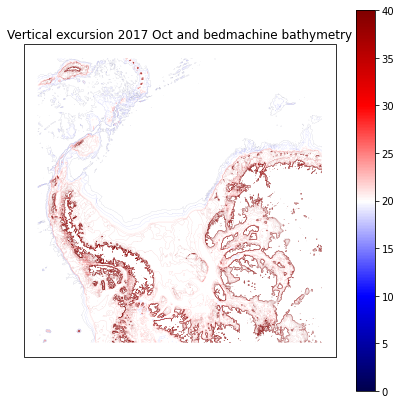

In [58]:
plt.figure(figsize=(7,7))

ax = plt.axes(projection = Projection)
# plt.title('Average Roughness 2016 (Mean)')
plt.title('Vertical excursion 2017 Oct and bedmachine bathymetry')

ix1=0
ix2=7000
iy1=1000
iy2=8000

#CAA
# levels = [-3000,-2500,-2000,-1500,-1000,-750,-500,-400,-300,-200,-150,-100,-75,-50,-25,0]
#Russia
levels = [-3000,-2500,-2000,-1500,-1000,-750,-500,-400,-300,-200,-150,-100,-80,-60,-50,-40,-30,-20,-10,0]

# levels = np.arange(-1000, 0, 50)
plt.contour(xx[ix1:ix2,iy1:iy2], yy[ix1:ix2,iy1:iy2], df.bed[ix1:ix2,iy1:iy2], levels, vmin=-3000, vmax=0, linewidths=0.05, alpha=1., cmap='seismic')
plt.pcolormesh(xx[ix1:ix2,iy1:iy2], yy[ix1:ix2,iy1:iy2], vertical_excursion_bed[ix1:ix2,iy1:iy2], zorder=0 ,vmin=0, vmax=40, cmap='seismic')

# plt.pcolormesh(xtest2[ix1:ix2,iy1:iy2], ytest2[ix1:ix2,iy1:iy2], df.z[ix1:ix2,iy1:iy2], zorder=0 ,vmin=-1000, vmax=0, cmap='seismic')
# ax.add_feature(land_10m, zorder=1, edgecolor='black', linewidth=0.02)
plt.colorbar()
plt.savefig('Vertical_Mixing_Bedmachine_bathy_Weddell_contourf_large_alpha.png', dpi = 1400)
# plt.savefig('Roughness_IBCAO_bathy_Russia_contourf_large_alpha.png', dpi = 1400)







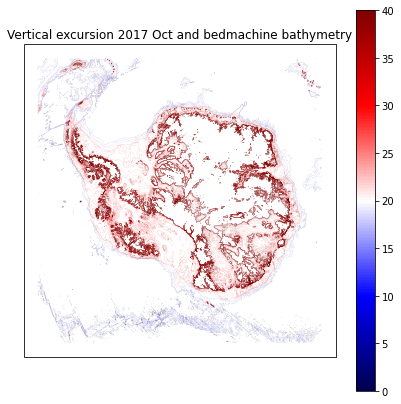

In [59]:
plt.figure(figsize=(7,7))

ax = plt.axes(projection = Projection)
# plt.title('Average Roughness 2016 (Mean)')
plt.title('Vertical excursion 2017 Oct and bedmachine bathymetry')

#CAA
# levels = [-3000,-2500,-2000,-1500,-1000,-750,-500,-400,-300,-200,-150,-100,-75,-50,-25,0]
#Russia
levels = [-3000,-2500,-2000,-1500,-1000,-750,-500,-400,-300,-200,-150,-100,-80,-60,-50,-40,-30,-20,-10,0]

# levels = np.arange(-1000, 0, 50)
plt.contour(xx, yy, df.bed, levels, vmin=-3000, vmax=0, linewidths=0.05, alpha=1., cmap='seismic')
plt.pcolormesh(xx, yy, vertical_excursion_bed, zorder=0 ,vmin=0, vmax=40, cmap='seismic')

# plt.pcolormesh(xtest2[ix1:ix2,iy1:iy2], ytest2[ix1:ix2,iy1:iy2], df.z[ix1:ix2,iy1:iy2], zorder=0 ,vmin=-1000, vmax=0, cmap='seismic')
# ax.add_feature(land_10m, zorder=1, edgecolor='black', linewidth=0.02)
plt.colorbar()
plt.savefig('Vertical_Mixing_Bedmachine_bathy_panAntarctic_contourf_large.png', dpi = 1400)
# plt.savefig('Roughness_IBCAO_bathy_Russia_contourf_large_alpha.png', dpi = 1400)








In [61]:
# x_vert,y_vert=P(vertical_excursion_lon_g,vertical_excursion_lat_g)

In [56]:
# x_vert.shape

In [57]:
# vertical_excursion[0].T.shape

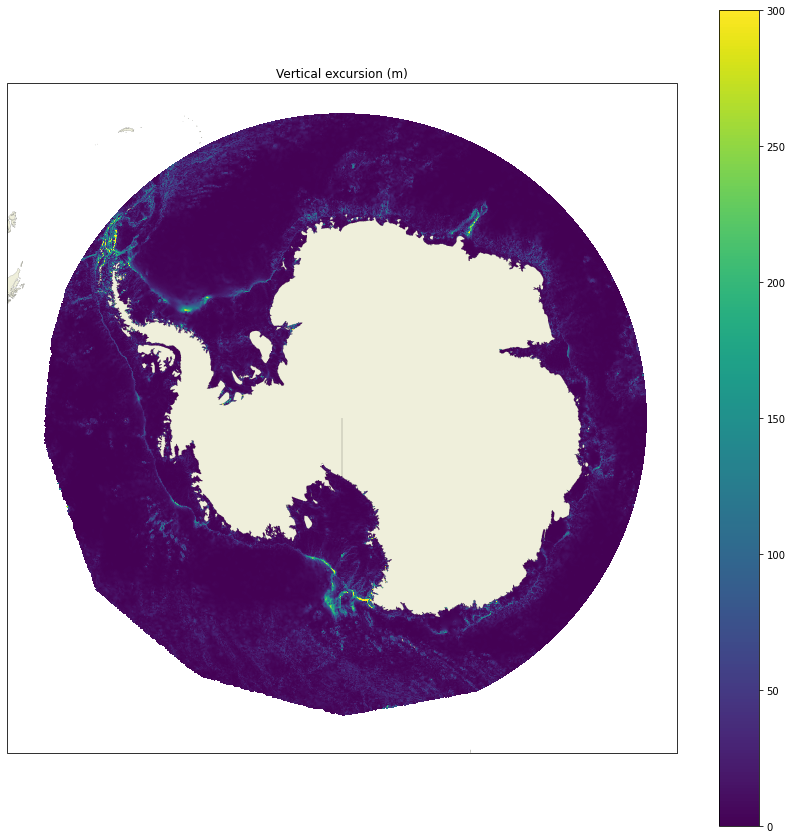

In [96]:
plt.figure(figsize=(15,15))

ax = plt.axes(projection = Projection)
plt.title('Vertical excursion (m)')
s=1
plt.pcolormesh(x_vert[::s,::s], y_vert[::s,::s], vertical_excursion[0,::s,::s], zorder=0 ,vmin=0, vmax=300)#, cmap='seismic')
ax.add_feature(land_10m, zorder=1, edgecolor='black', linewidth=0.1)
plt.colorbar()
plt.savefig('VerticalExcursion_20170901.png', dpi = 400)




In [ ]:
# Loop over days 

In [74]:
path_tides='/Users/micheltsamados/Documents/Data/Tides/tidal_dissipation_diags/Antarctica/'
file_AA='vertical_excursion-2017.09.huv.nc'

data_mixing=Dataset(path_tides+file_AA,"r")

In [75]:
vertical_excursion=data_tides.variables['vertical_excursion']



<Figure size 432x288 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

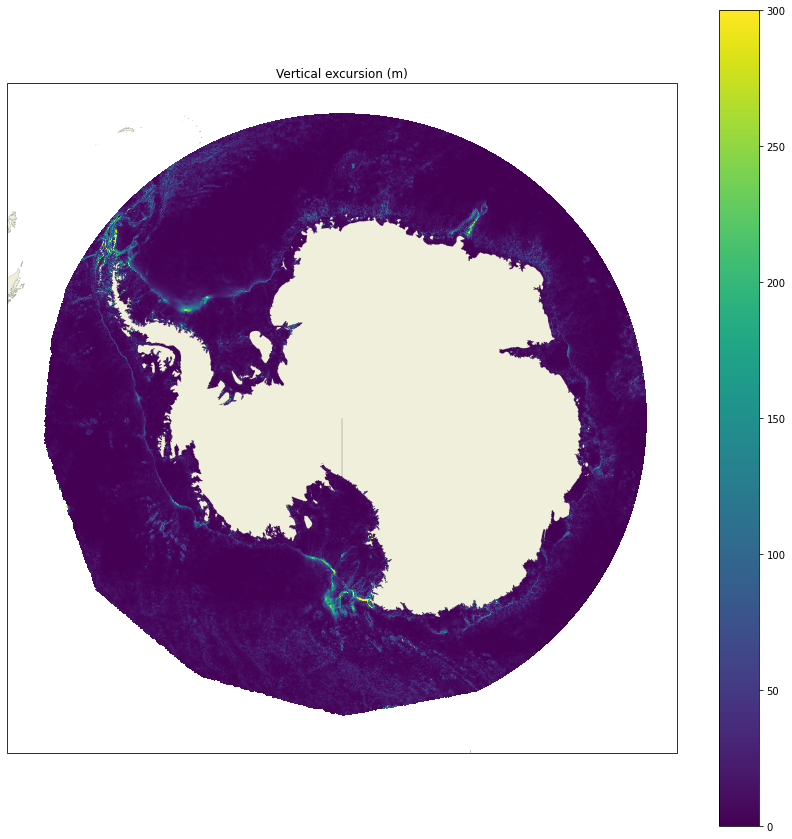

In [97]:
file_AA='vertical_excursion-2017.10.huv.nc'
for d in range(15):
    day_str = '%02d' % (d+1)
    data_mixing=Dataset(path_tides+file_AA,"r")
    vertical_excursion=data_tides.variables['vertical_excursion']
    plt.clf()
    plt.figure(figsize=(15,15))
    ax = plt.axes(projection = Projection)
    plt.title('Vertical excursion (m)')
    s=1
    plt.pcolormesh(x_vert[::s,::s], y_vert[::s,::s], vertical_excursion[d,::s,::s], zorder=0 ,vmin=0, vmax=300)#, cmap='seismic')
    ax.add_feature(land_10m, zorder=1, edgecolor='black', linewidth=0.1)
    plt.colorbar()
    plt.savefig('VerticalExcursion_201710'+day_str+'.png', dpi = 200)


In [ ]:
# Save video

In [80]:
pip install moviepy

     |████████████████████████████████| 388 kB 11.3 MB/s eta 0:00:01
     |████████████████████████████████| 22.5 MB 10.4 MB/s eta 0:00:01
  Created wheel for moviepy: filename=moviepy-1.0.3-py3-none-any.whl size=110724 sha256=8a3e3fe84bfd57c79256890824f64b35bc6831108bccc0c6d3e9f3420ec20b77
  Stored in directory: /Users/micheltsamados/Library/Caches/pip/wheels/56/dc/2b/9cd600d483c04af3353d66623056fc03faed76b7518faae4df
  Created wheel for proglog: filename=proglog-0.1.9-py3-none-any.whl size=6147 sha256=36f846c6eee4c3c34d4fa4adfc27624c5d5bd3931ecb4e4f84a1e69f43960185
  Stored in directory: /Users/micheltsamados/Library/Caches/pip/wheels/12/36/1f/dc61e6ac10781d63cf6fa045eb09fa613a667384e12cb6e6e0
Successfully built moviepy proglog
Note: you may need to restart the kernel to use updated packages.


In [98]:
# turn jpegs into mp4 video

from moviepy.editor import *
f_in = './VerticalExcursion_201710'+'*.png'
f_out ="./VericalExcursion_201710.mp4"



files = [f for f in sorted(glob.glob(f_in))]
clip = ImageSequenceClip(files, fps = 10)
clip.write_videofile(f_out)

t:  12%|█▎        | 2/16 [00:00<00:00, 15.07it/s, now=None]

Moviepy - Building video ./VericalExcursion_201710.mp4.
Moviepy - Writing video ./VericalExcursion_201710.mp4



Moviepy - Done !
Moviepy - video ready ./VericalExcursion_201710.mp4


In [93]:
files

['./VerticalExcursion_20170901.png',
 './VerticalExcursion_20170902.png',
 './VerticalExcursion_20170903.png',
 './VerticalExcursion_20170904.png',
 './VerticalExcursion_20170905.png',
 './VerticalExcursion_20170906.png',
 './VerticalExcursion_20170907.png',
 './VerticalExcursion_20170908.png',
 './VerticalExcursion_20170909.png',
 './VerticalExcursion_20170910.png',
 './VerticalExcursion_20170911.png',
 './VerticalExcursion_20170912.png',
 './VerticalExcursion_20170913.png',
 './VerticalExcursion_20170914.png',
 './VerticalExcursion_20170915.png',
 './VerticalExcursion_20170916.png',
 './VerticalExcursion_20170917.png',
 './VerticalExcursion_20170918.png',
 './VerticalExcursion_20170919.png',
 './VerticalExcursion_20170920.png',
 './VerticalExcursion_20170921.png',
 './VerticalExcursion_20170922.png',
 './VerticalExcursion_20170923.png',
 './VerticalExcursion_20170924.png',
 './VerticalExcursion_20170925.png',
 './VerticalExcursion_20170926.png',
 './VerticalExcursion_20170927.png',
 